# Multi-Objective Optimization of Radiation-Shielding High-Entropy Alloys: Balancing Performance, Stability, and Cost

## 1. Introduction and Project Overview

## 2. Environment Setup

### Install

In [ ]:
pip install optuna

### Import

In [8]:
import pandas as pd
import numpy as np
import itertools
import optuna
from mendeleev import element
import time

optuna.logging.set_verbosity(optuna.logging.WARNING)

## 3. Data Acquisition and Characterization

### 3.1 Mass Attenuation Coefficient

In [9]:
# Linear Attenuation Coefficient for 100 keV
MAC = pd.read_excel("../data/MAC_elements.xlsx")
MAC

,element,81 keV,160 keV,356 keV,662 keV,1408 keV,6000 keV
0,Al,0.199909,0.134160,0.097234,0.074592,0.051709,0.02655
1,Co,0.624322,0.188487,0.099400,0.072462,0.049650,0.03045
2,Hf,7.120085,1.262483,0.225512,0.095659,0.051320,0.04155
3,Mn,0.517325,0.172662,0.097085,0.071615,0.049223,0.02952
4,Nb,1.793163,0.356387,0.115835,0.074192,0.048939,0.03432
5,Ni,0.710613,0.204888,0.104485,0.075671,0.051764,0.03210
6,Pd,2.400086,0.447789,0.125130,0.075247,0.048559,0.03537
7,Pt,8.464466,1.533452,0.263279,0.104591,0.053176,0.04310
8,Ta,7.350919,1.308359,0.231760,0.097154,0.051673,0.04188
9,Ti,0.396316,0.156709,0.096057,0.071878,0.049566,0.02868


In [10]:
# Make elements to index
elements_list = MAC['element'].tolist()
element_to_idx = {elem: i for i, elem in enumerate(elements_list)}
num_elements = len(element_to_idx)

In [13]:
# Make the LAC as dict
MAC_dict = dict(zip(MAC['element'], MAC['81 keV']))
MAC_dict

{'Al': 0.1999088744307677,
 'Co': 0.6243218507534496,
 'Hf': 7.120085355174026,
 'Mn': 0.5173253862922937,
 'Nb': 1.793162625900835,
 'Ni': 0.7106125445322776,
 'Pd': 2.400086380593941,
 'Pt': 8.464466398903081,
 'Ta': 7.350919053834041,
 'Ti': 0.3963161088513238,
 'Zr': 1.666521738381989}

### 3.2 Thermodynamic Datasets

Reference :

- _Deffrennes, G., Bizot, Q., Ogamino, E., Hallstedt, B., Abe, T., Fischer, E., Joubert, J.-M., Terayama, G., & Tamura, R. (2026). Dataset on the enthalpy of mixing in binary liquids (Version 4) [Data set]. Mendeley Data. https://doi.org/10.17632/6wt6t9kswt.4_
  

In [14]:
# Mixing enthapy data
enthalpy = pd.read_excel("../data/enthalpy_mixing_large_dataset.xlsx", index_col=0)

# Make enthalpy as matrix with N x N shape
enthalpy_matrix = enthalpy.values * 4
enthalpy

,Al,Ti,Mn,Co,Ni,Cu,Zn,Zr,Nb,Mo,Pd,Hf,Ta,W,Pt
Al,0.000,-29.621,-17.745,-32.880,-52.007,-16.970,2.594,-45.088,-20.392,-14.981,-56.857,-40.629,-19.658,-6.896,-57.072
Ti,-29.621,0.000,-8.988,-30.686,-38.492,-5.032,-15.646,3.840,4.427,-14.965,-67.836,-4.358,-4.578,-6.813,-77.790
Mn,-17.745,-8.988,0.000,-3.901,-10.949,0.613,-1.420,-11.400,-0.308,2.458,-25.144,-20.195,-9.580,2.997,-28.437
Co,-32.880,-30.686,-3.901,0.000,0.250,8.204,-2.967,-36.342,-18.306,-17.989,-0.245,-39.752,-32.682,-9.693,-9.550
Ni,-52.007,-38.492,-10.949,0.250,0.000,2.985,-13.172,-45.439,-22.309,-17.914,1.979,-46.378,-37.764,-11.506,-9.416
Cu,-16.970,-5.032,0.613,8.204,2.985,0.000,-9.978,-17.545,6.958,8.914,-15.501,-19.745,-1.032,15.719,-10.326
Zn,2.594,-15.646,-1.420,-2.967,-13.172,-9.978,0.000,-39.301,-3.025,6.782,-41.342,-36.410,-8.252,6.989,-38.287
Zr,-45.088,3.840,-11.400,-36.342,-45.439,-17.545,-39.301,0.000,4.520,-11.268,-92.346,-0.722,-3.482,-11.585,-96.850
Nb,-20.392,4.427,-0.308,-18.306,-22.309,6.958,-3.025,4.520,0.000,-3.854,-47.649,0.998,-2.070,-15.552,-64.187
Mo,-14.981,-14.965,2.458,-17.989,-17.914,8.914,6.782,-11.268,-3.854,0.000,-19.742,-5.518,-9.033,-10.678,-38.862


### 3.3 Raw Material Prices

Reference : 

- https://mineralprices.com 15-May-2026

In [15]:
price_df = pd.read_excel("../data/elements_price.xlsx")
price_map = dict(zip(price_df['element'], price_df['price (USD per kg)']))

# Create price array matching the elements_list order
price_arr = np.array([price_map.get(e, 0) for e in elements_list])

<div align="center">
    <img src="https://www.researchgate.net/profile/Sun-Tao-2/publication/327044105/figure/fig9/AS:660049345118208@1534379435219/Mass-attenuation-coefficient-of-water-at-different-photon-energy-levels-Contribution_W640.jpg" width="60%">
</div>

In [16]:
properties = {}

for symbol in elements_list:
    el = element(symbol)
    properties[symbol] = {
        'radius' : el.atomic_radius,
        'Tm' : el.melting_point,
        'density' : el.density,
        'mass' : el.atomic_weight,
        'mu_rho' : MAC_dict.get(symbol)
    }

properties

{'Al': {'radius': 125.0,
  'Tm': 933.473,
  'density': 2.7,
  'mass': 26.9815385,
  'mu_rho': 0.1999088744307677},
 'Co': {'radius': 135.0,
  'Tm': 1768.15,
  'density': 8.86,
  'mass': 58.933194,
  'mu_rho': 0.6243218507534496},
 'Hf': {'radius': 155.0,
  'Tm': 2506.15,
  'density': 13.3,
  'mass': 178.49,
  'mu_rho': 7.120085355174026},
 'Mn': {'radius': 140.0,
  'Tm': 1519.15,
  'density': 7.3,
  'mass': 54.938044,
  'mu_rho': 0.5173253862922937},
 'Nb': {'radius': 145.0,
  'Tm': 2750.15,
  'density': 8.57,
  'mass': 92.90637,
  'mu_rho': 1.793162625900835},
 'Ni': {'radius': 135.0,
  'Tm': 1728.15,
  'density': 8.9,
  'mass': 58.6934,
  'mu_rho': 0.7106125445322776},
 'Pd': {'radius': 140.0,
  'Tm': 1827.9499999999998,
  'density': 12.0,
  'mass': 106.42,
  'mu_rho': 2.400086380593941},
 'Pt': {'radius': 135.0,
  'Tm': 2041.35,
  'density': 21.5,
  'mass': 195.084,
  'mu_rho': 8.464466398903081},
 'Ta': {'radius': 145.0,
  'Tm': 3290.15,
  'density': 16.4,
  'mass': 180.94788,
  'm

In [17]:
# Make the properties to an array
radii_arr = np.array([properties[e]['radius'] for e in elements_list])
tm_arr    = np.array([properties[e]['Tm'] for e in elements_list])
density_arr = np.array([properties[e]['density'] for e in elements_list])
mass_arr = np.array([properties[e]['mass'] for e in elements_list])

In [18]:
# Daftar energi sesuai permintaan Anda
energy_cols = ['81 keV', '160 keV', '356 keV', '662 keV', '1408 keV', '6000 keV']

# 2. Pastikan mu_rho_arr menyimpan matrix 6 kolom, bukan 1 nilai
# Update dictionary properties Anda agar mu_rho berisi array/list 6 nilai
mu_rho_matrix = []
for _, row in MAC.iterrows():
    mu_rho_matrix.append(row[energy_cols].values)
mu_rho_arr = np.array(mu_rho_matrix) 
# Pastikan urutan mu_rho_arr sesuai dengan elements_list

element_lacs = mu_rho_arr * density_arr[:, np.newaxis]

# Ambil nilai LAC maksimal untuk setiap kolom energi (6 energi)
max_lac_per_energy = np.max(element_lacs, axis=0)

## 4. Theoritical Framework and Governing Equations

### 4.1 Empirical Phase Formation Rules

**Atomic Size Difference**

$$\delta = \sqrt{\sum_{i=1}^{n}{c_i \left (1 - \frac{r_i}{\bar{r}} \right)^2}}$$

with 

$$\bar{r} = \sum_{i=1}^n {c_i r_i}$$

**Mixing Enthalpy**

$$\Delta H_{mix} = \sum_{i=1, i\neq j}^n {4 \Delta H_{AB}^{mix} c_i c_j}$$

In matrix, it's equivalent with

$$\Delta H_{mix} =  \mathbf{c}^T \mathbf{Hc}$$

**Melting Point**

$$T_{m mix}  = \sum_{i=1}^n {c_i (T_m)_i}$$

**Entropy of Mixing**

$$\Delta S_{mix} = -R \sum_{i=1}^n {c_i \ln{ci}}$$

**Omega**

$$\Omega = \frac{T_m \Delta S_{mix}}{|\Delta H_{mix}|}$$

### 4.2 Radiation Shielding Physics

**Alloy Density**
Mixture molar mass 

$$M_{mix} = \sum_{i=1}^n {c_i M_i}$$

Mixture molar volume

$$V_{mix} = \sum_{i=1}^n c_i \left (\frac{M_i}{\rho_i}\right)$$

Alloy density

$$\rho_{alloy} = \frac{M_{mix}}{V_{mix}}$$

**Linear Coefficient Attenuation**

Weight fraction

$$w_i = \frac{c_i M_i}{\sum_{j=1}^n {c_j M_j}}$$

Mass attenuation coefficient

$$\left (\frac{\mu}{\rho}\right)_{mix} = \sum_{i=1}^n{w_i \left (\frac{\mu}{\rho}\right)_{i}}$$

Linear attenuation coefficient

$$\mu = \rho_{alloy} \left (\frac{\mu}{\rho}\right)_{mix}$$

**Shielding score**

$$\text{shielding score} = \frac{1}{N} \sum_k^N \hat{\mu}_{E_k}$$

with 

$$\hat{\mu_E}=\frac{\mu_E}{\text{max} \, \text{LAC}_E}$$

**Final score**

$$\text{final score} = (w_1 \cdot LAC_{norm}) + (w_2 \cdot (1 - cost_{norm})) + (w_3 \cdot (1 - \rho_{norm})) $$

In [19]:
def calculate_HEA_properties(c, r, t, d, m, mr, h, p, max_lacs):
    # Perhitungan dasar
    avg_r = np.dot(c, r)
    delta = 100 * np.sqrt(np.dot(c, (1 - r / avg_r)**2))
    h_mix = c @ h @ c
    
    # Densitas
    molar_mass_mix = np.dot(c, m)
    molar_volume_mix = np.dot(c, m / d)
    alloy_density = molar_mass_mix / molar_volume_mix
    
    # Weight fraction untuk harga dan LAC
    weight_fractions = (c * m) / molar_mass_mix
    
    # Hitung Harga
    total_price = np.dot(weight_fractions, p)
    
    # Hitung LAC (Linear Attenuation Coefficient) asli
    mac_mix_array = np.dot(weight_fractions, mr)
    lac_mix_array = mac_mix_array * alloy_density
    
    # --- NORMALISASI ---
    # Membagi LAC campuran dengan LAC maksimal di setiap energi
    normalized_lac = lac_mix_array / max_lacs
    
    # Score adalah rata-rata dari LAC yang sudah dinormalisasi (0.0 - 1.0)
    shielding_score = np.mean(normalized_lac)
    
    # Termodinamika
    tm_mix = np.dot(c, t)
    s_mix = -8.314 * np.dot(c, np.log(c + 1e-12))
    abs_h_mix_J = abs(h_mix * 1000)
    omega = (tm_mix * s_mix) / abs_h_mix_J if abs_h_mix_J > 0 else 1e9
    
    return alloy_density, shielding_score, lac_mix_array, total_price, delta, h_mix, tm_mix, s_mix, omega

## 5. Multi-Objective Bayesian Optimization


<div align="center">
    <img src="https://i0.wp.com/firasalhafez.com/wp-content/uploads/2021/05/bayesi_featured_image.png?fit=1140%2C500&ssl=1" width="100%">
</div>

### 5.1 Objective Function 

In [21]:
def create_objective(config, sub_props):
    def objective(trial):
        c = [trial.suggest_float(f'c{i}', 0.05, 0.35) for i in range(1, 5)]
        c5 = 1.0 - sum(c)
        
        if not (0.05 <= c5 <= 0.35):
            return 0.0, 999.0, 999999.0 # Penalize heavily if out of bounds
        
        fractions = np.array(c + [c5])
        # Tambahkan max_macs ke argumen
        density, score, lac_array, price, delta, h_mix, tm_mix, s_mix, omega = calculate_HEA_properties(
            fractions, **sub_props, max_lacs=max_lac_per_energy)
        
        trial.set_user_attr("price", price)
        trial.set_user_attr("c5", c5)
        trial.set_user_attr("delta", delta)
        trial.set_user_attr("h_mix", h_mix)
        trial.set_user_attr("omega", omega)
        trial.set_user_attr("s_mix", s_mix)

        # Output sekarang adalah densitas dan shielding_score (komposit 6 energi)
        return score, density, price
    return objective

### 5.2 Constraints Function

| Metric | Target value | Physical significance |
| :--- | :--- | :--- |
| $c_i$ | $5\%$ to $35\%$ | Defines the high entropy multi-component regime. |
| $\delta$ | $\leq 6.6%$ | Low lattice distortion favors solid solution stability over intermetallics. |
| $\Delta S_{mix}$ | $\geq 1.5R$ | High configurational entropy stabilizes disordered structures. |
| $\Omega$ | $1.1$ | Evaluate competitive balance between entropy and enthalpy. |

Referece:

- _Zhang, Y., Guo, S., Liu, C.T., Yang, X. (2016). Phase Formation Rules. In: Gao, M., Yeh, JW., Liaw, P., Zhang, Y. (eds) High-Entropy Alloys. Springer, Cham. https://doi.org/10.1007/978-3-319-27013-5_2_
- _Yeh, JW. Physical Metallurgy of High-Entropy Alloys. JOM 67, 2254–2261 (2015). https://doi.org/10.1007/s11837-015-1583-5_
- _Yang, X., & Zhang, Y. (2012). Prediction of high-entropy stabilized solid-solution in multi-component alloys. Materials Chemistry and Physics, 132(2–3), 233–238. https://doi.org/10.1016/j.matchemphys.2011.11.021_

In [20]:
def create_constraints(config):
    def constraints_func(trial):
        # Get value from user_attrs, also give default if it's the first trial
        delta = trial.user_attrs.get("delta", 0.0)
        h_mix = trial.user_attrs.get("h_mix", -5.0)
        omega = trial.user_attrs.get("omega", 2.0)
        s_mix = trial.user_attrs.get("s_mix", 13.0)
        c5 = trial.user_attrs.get("c5", 0.20)

        return [
            0.05 - c5, 
            c5 - 0.35,
            delta - 6.6,
            h_mix - 5,
            -15 - h_mix, 
            1.1 - omega,
            12.471 - s_mix
        ]
    return constraints_func

## Main Loop

In [23]:
def main():
    configurations = list(itertools.combinations(elements_list, 5))
    best_results = []
    print(f"\nStarting optimization for {len(configurations)} HEA configurations...")

    for i, config in enumerate(configurations, 1):
        print(f"[{i}/{len(configurations)}] Optimizing: {'-'.join(config)}...")
        indices = [element_to_idx[e] for e in config]
        
        # Define sub_props with the price array
        sub_props = {
            'r': radii_arr[indices],
            't': tm_arr[indices],
            'd': density_arr[indices],
            'm': mass_arr[indices],
            'mr': mu_rho_arr[indices],
            'h': enthalpy_matrix[np.ix_(indices, indices)],
            'p': price_arr[indices] # Ensure price_arr is defined globally
        }

        # Optimization Setup
        constraints = create_constraints(config)
        sampler = optuna.samplers.NSGAIISampler(constraints_func=constraints)
        
        # 3 Objectives: Maximize LAC (Score), Minimize Density, Minimize Price
        study = optuna.create_study(directions=["maximize", "minimize", "minimize"], sampler=sampler)
        study.optimize(create_objective(config, sub_props), n_trials=1000, n_jobs=-1)

        # Filter trials that pass all constraints
        pareto_front = [t for t in study.best_trials if t.values and t.values[0] > 0.0 and all(c <= 0 for c in constraints(t))]

        for t in pareto_front:
            c_params = t.params
            if 'c1' not in c_params: continue

            c5 = 1.0 - sum(c_params.values())
            fractions = [c_params['c1'], c_params['c2'], c_params['c3'], c_params['c4'], c5]
        
            f_array = np.array(fractions)
            # Use updated properties function that returns LAC and Price
            density, score, lac_array, price, delta, h_mix, tm_mix, s_mix, omega = calculate_HEA_properties(f_array, **sub_props, max_lacs=max_lac_per_energy)

            res = {
                'Configuration': '-'.join(config),
                config[0]: round(fractions[0], 4),
                config[1]: round(fractions[1], 4),
                config[2]: round(fractions[2], 4),
                config[3]: round(fractions[3], 4),
                config[4]: round(fractions[4], 4),
                'Density (g/cm3)': round(density, 3),
                'Shielding Score (Avg LAC)': round(score, 4),
                'Price (USD/kg)': round(price, 2) # ADDED PRICE COLUMN
            }
            
            # Save LAC instead of MAC for each energy level
            energy_labels = ['81keV', '160keV', '356keV', '662keV', '1408keV', '6000keV']
            for idx, label in enumerate(energy_labels):
                res[f'LAC_{label}'] = round(lac_array[idx], 5)

            res.update({
                'Delta (%)': round(delta, 3),
                'H_mix (kJ/mol)': round(h_mix, 3),
                'S_mix (J/mol.K)': round(s_mix, 3),
                'Omega': round(omega, 3),
                'Tm_mix (K)': round(tm_mix, 1)
            })
            
            best_results.append(res)
            
    df_results = pd.DataFrame(best_results)

    if df_results.empty:
        print("No result. All configurations got penalty by HEA criteria.")
        return
    
    # Define column order including Price and LAC
    lac_cols = [f'LAC_{l}' for l in energy_labels]
    
    physical_cols = [
        'Density (g/cm3)', 
        'Shielding Score (Avg LAC)', 
        'Price (USD/kg)' # Added to list
    ] + lac_cols + [
        'Delta (%)', 'H_mix (kJ/mol)', 'S_mix (J/mol.K)', 'Omega', 'Tm_mix (K)'
    ]
    
    # Re-order and fill missing
    element_cols = [col for col in df_results.columns if col not in ['Configuration'] + physical_cols]
    new_column_order = ['Configuration'] + element_cols + physical_cols
    df_results = df_results.reindex(columns=new_column_order)
    df_results = df_results.fillna(0.0)
    
    # Sort by Shielding Score (Avg LAC) descending
    df_results = df_results.sort_values(by=["Shielding Score (Avg LAC)"], ascending=False)

    #output_filename = "../outputs/result-TPE-1000-trials.csv"
    #df_results.to_csv(output_filename, index=False)

    print("\nOptimization complete")
    #print(f"Result is saved in: '{output_filename}'")
    print(df_results[['Configuration', 'Density (g/cm3)', 'Shielding Score (Avg LAC)', 'Price (USD/kg)', 'Omega']].head(10).to_string(index=False))

if __name__ == "__main__":
    start_time = time.perf_counter()
    main()
    end_time = time.perf_counter()
    print(f"\nRunning time: {end_time - start_time:.6f} seconds")


Starting optimization for 462 HEA configurations...
[1/462] Optimizing: Al-Co-Hf-Mn-Nb...
[2/462] Optimizing: Al-Co-Hf-Mn-Ni...
[3/462] Optimizing: Al-Co-Hf-Mn-Pd...
[4/462] Optimizing: Al-Co-Hf-Mn-Pt...
[5/462] Optimizing: Al-Co-Hf-Mn-Ta...
[6/462] Optimizing: Al-Co-Hf-Mn-Ti...
[7/462] Optimizing: Al-Co-Hf-Mn-Zr...
[8/462] Optimizing: Al-Co-Hf-Nb-Ni...
[9/462] Optimizing: Al-Co-Hf-Nb-Pd...
[10/462] Optimizing: Al-Co-Hf-Nb-Pt...
[11/462] Optimizing: Al-Co-Hf-Nb-Ta...
[12/462] Optimizing: Al-Co-Hf-Nb-Ti...
[13/462] Optimizing: Al-Co-Hf-Nb-Zr...
[14/462] Optimizing: Al-Co-Hf-Ni-Pd...
[15/462] Optimizing: Al-Co-Hf-Ni-Pt...
[16/462] Optimizing: Al-Co-Hf-Ni-Ta...
[17/462] Optimizing: Al-Co-Hf-Ni-Ti...
[18/462] Optimizing: Al-Co-Hf-Ni-Zr...
[19/462] Optimizing: Al-Co-Hf-Pd-Pt...
[20/462] Optimizing: Al-Co-Hf-Pd-Ta...
[21/462] Optimizing: Al-Co-Hf-Pd-Ti...
[22/462] Optimizing: Al-Co-Hf-Pd-Zr...
[23/462] Optimizing: Al-Co-Hf-Pt-Ta...
[24/462] Optimizing: Al-Co-Hf-Pt-Ti...
[25/462] Optimizing:

## Visualization

### 1. Profile of Linear Attenuation Coefficient

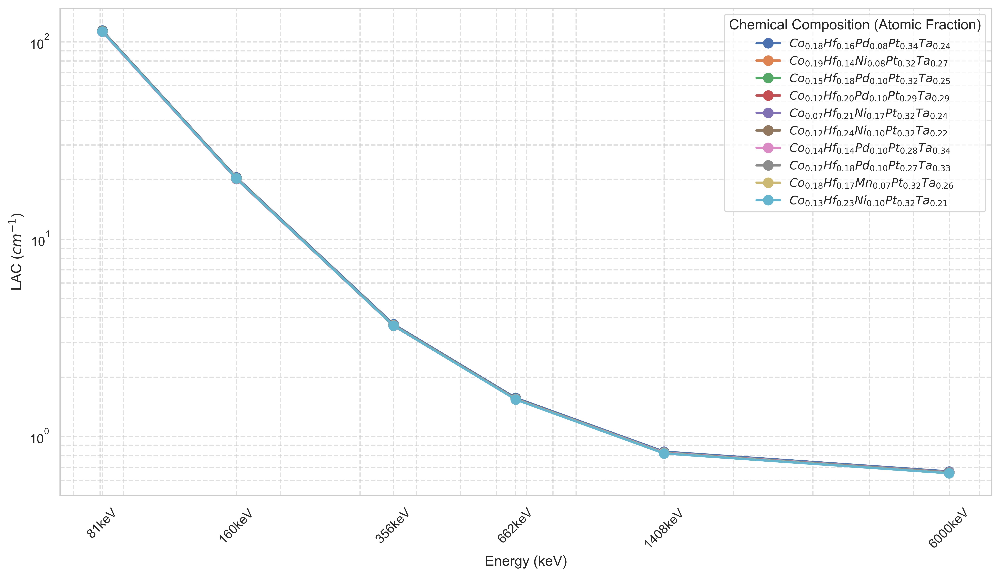

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Load Data
# Pastikan path file benar sesuai direktori Anda
df = pd.read_csv("../outputs/result-TPE-1000-trials-fixed.csv")

# Ambil 10 terbaik berdasarkan Shielding Score
top_10 = df.head(10).copy()

# Fungsi untuk membuat label rumus kimia (contoh: W_{0.2}Ta_{0.2}...)
def format_formula(row):
    elements = row['Configuration'].split('-')
    formula_parts = []
    for el in elements:
        # Mengambil nilai fraksi dari kolom nama elemen (misal kolom 'W')
        fraction = row[el]
        # Menggunakan format LaTeX: Element_{fraction}
        # Kita bulatkan ke 2 desimal agar label tidak terlalu panjang
        formula_parts.append(f"{el}_{{{fraction:.2f}}}")
    return f"${''.join(formula_parts)}$"

# Set style
sns.set_theme(style="whitegrid")

# --- VISUALISASI 2: MAC vs ENERGI (Top 5 Konfigurasi) ---
energy_labels = ['81keV', '160keV', '356keV', '662keV', '1408keV', '6000keV']
energy_values = [81, 160, 356, 662, 1408, 6000]
# Menggunakan kolom LAC sesuai data Anda (Linear Attenuation Coefficient)
lac_cols = [f'LAC_{l}' for l in energy_labels]

plt.figure(figsize=(12, 7), dpi=500)

for i in range(10):
    row = top_10.iloc[i]
    # Generate label baru dengan fraksi atom
    new_label = format_formula(row)
    
    plt.plot(energy_values, row[lac_cols].values, 
             marker='o', markersize=8, linewidth=2, label=new_label)

plt.xscale('log') 
plt.yscale('log')
# plt.title('Profile Linear Attenuation Coefficient (LAC) Top 5 HEA', fontsize=16, fontweight='bold')
plt.xlabel('Energy (keV)', fontsize=12)
plt.ylabel('LAC ($cm^{-1}$)', fontsize=12) # Satuan LAC biasanya cm^-1
plt.xticks(energy_values, energy_labels, rotation=45)
plt.legend(title="Chemical Composition (Atomic Fraction)", fontsize=10, loc='best')
plt.grid(True, which="both", ls="--", alpha=0.6)
plt.tight_layout()

# Simpan hasil
plt.savefig("../outputs/LAC_profile_with_fractions-fixed.png")
plt.show()

### 2. Elemental Composition

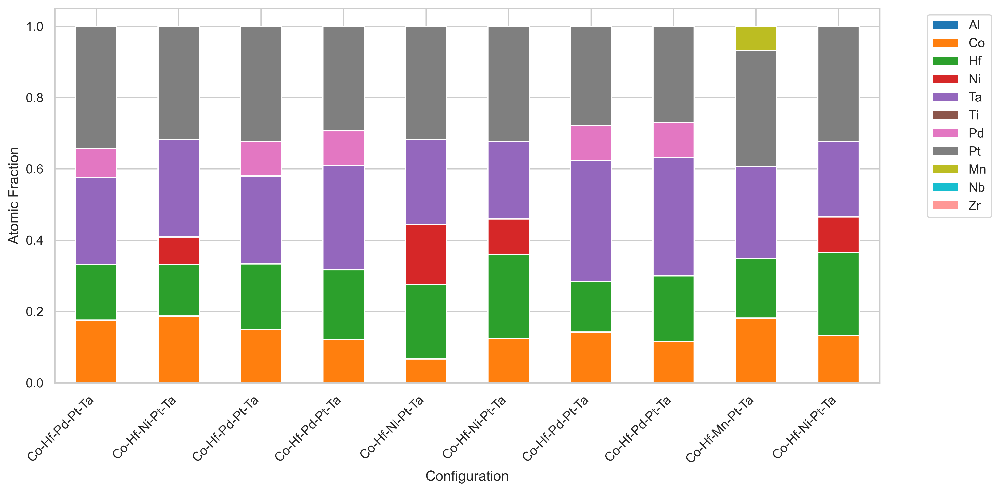

In [11]:
import matplotlib.pyplot as plt
import pandas as pd

# Pastikan data top_10 sudah diambil dari df_results terbaru
# top_10 = df_results.head(10)

# 1. Definisikan list label LAC (Pengganti mac_cols)
energy_labels = ['81keV', '160keV', '356keV', '662keV', '1408keV', '6000keV']
lac_cols = [f'LAC_{l}' for l in energy_labels]

# 2. Update physical_props dengan nama kolom yang baru (termasuk Price)
physical_props = [
    'Density (g/cm3)', 'Shielding Score (Avg LAC)', 'Price (USD/kg)', 
    'Delta (%)', 'H_mix (kJ/mol)', 'S_mix (J/mol.K)', 'Omega', 'Tm_mix (K)', 'Final_Score'
] + lac_cols

# Filter kolom untuk hanya menyisakan elemen saja
element_cols = [c for c in top_10.columns if c not in physical_props and c != 'Configuration']

# --- TAMBAHAN: Kamus Warna Konstan ---
# Definisikan warna spesifik untuk setiap elemen menggunakan kode Hex atau nama warna
element_color_map = {
    'Al': '#1f77b4',  # Biru (tab:blue)
    'Co': '#ff7f0e',  # Oranye (tab:orange)
    'Hf': '#2ca02c',  # Hijau (tab:green)
    'Ni': '#d62728',  # Merah (tab:red)
    'Ta': '#9467bd',  # Ungu (tab:purple)
    'Ti': '#8c564b',  # Coklat (tab:brown)
    'Pd': '#e377c2',  # Merah Muda (tab:pink)
    'Pt': '#7f7f7f',  # Abu-abu (tab:gray)
    'Mn': '#bcbd22',  # Zaitun (tab:olive)
    'Nb': '#17becf',  # Sian (tab:cyan)
    'Zr': '#ff9896'   # Merah Muda Terang (light red)
}

# Buat list warna berdasarkan urutan elemen yang ada di 'element_cols' saat ini
# Jika ada elemen yang tidak terdaftar di dictionary, ia akan diberi warna abu-abu gelap secara default ('#333333')
plot_colors = [element_color_map.get(el, '#333333') for el in element_cols]


# --- VISUALISASI 3: KOMPOSISI ELEMEN (Top 10) ---
fig, ax = plt.subplots(figsize=(12, 6), dpi=500)

# Ganti colormap='tab20' dengan argumen color=plot_colors
top_10.set_index('Configuration')[element_cols].plot(
    kind='bar', 
    stacked=True, 
    ax=ax, 
    color=plot_colors
)

# plt.title('Elemental Composition of Top 10 HEA for The Best Shielding', fontsize=14)
plt.ylabel('Atomic Fraction')
plt.xlabel('Configuration')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Tambahkan ha='right' agar teks x-axis tidak saling bertumpuk
plt.xticks(rotation=45, ha='right') 
plt.tight_layout()

# Simpan dan tampilkan
plt.savefig("../outputs/elemental_composition-fixed.png")
plt.show()

### 3. Pareto Front (Price vs LAC)

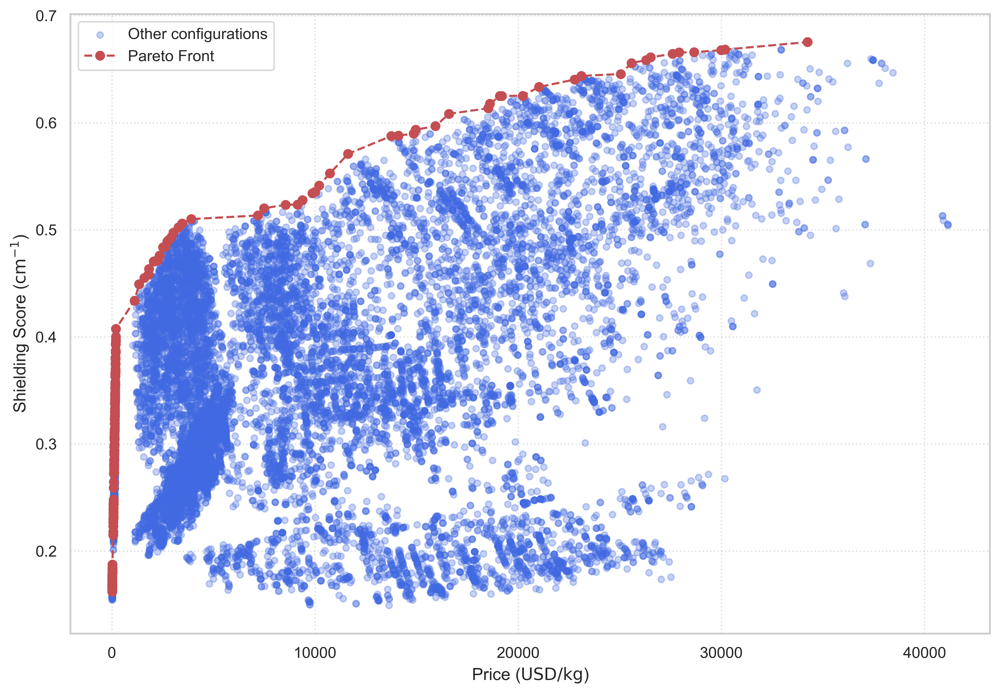

In [32]:
# 1. Ambil titik-titik yang membentuk Pareto Front
# Urutkan berdasarkan Price (Kecil ke Besar)
pareto_points = df.sort_values(by='Price (USD/kg)')
pf_x = [] # Price
pf_y = [] # LAC Score
current_max_score = -1

for i, row in pareto_points.iterrows():
    # Jika skor LAC lebih tinggi dari skor tertinggi sebelumnya pada harga yang lebih rendah/sama
    if row['Shielding Score (Avg LAC)'] > current_max_score:
        pf_x.append(row['Price (USD/kg)'])
        pf_y.append(row['Shielding Score (Avg LAC)'])
        current_max_score = row['Shielding Score (Avg LAC)']

# 2. Plotting
plt.figure(figsize=(10, 7), dpi=500)

# Plot semua titik konfigurasi
plt.scatter(df['Price (USD/kg)'], df['Shielding Score (Avg LAC)'], 
            alpha=0.3, color='royalblue', label='Other configurations', s=20)

# Plot Garis Pareto (The Best Trade-offs)
plt.plot(pf_x, pf_y, 'r--', marker='o', markersize=6, linewidth=1.5, label='Pareto Front')

"""
# 3. Anotasi untuk titik-titik di Pareto Front (Agar tahu komposisinya)
for i, row in pareto_points.iterrows():
    if row['Shielding Score (Avg LAC)'] in pf_y and row['Price (USD/kg)'] in pf_x:
        plt.annotate(row['Configuration'], 
                     (row['Price (USD/kg)'], row['Shielding Score (Avg LAC)']),
                     xytext=(5, 5), textcoords='offset points', 
                     fontsize=8, fontweight='bold', alpha=0.8)
"""
plt.xlabel(r'Price ($\text{USD/kg}$)', fontsize=12)
plt.ylabel(r'Shielding Score ($\text{cm}^{-1}$)', fontsize=12)
#plt.xscale('log') 

plt.grid(True, linestyle=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.savefig("../outputs/pareto_price_vs_lac.png")
plt.show()

### 3. Pareto Front (Price vs LAC)

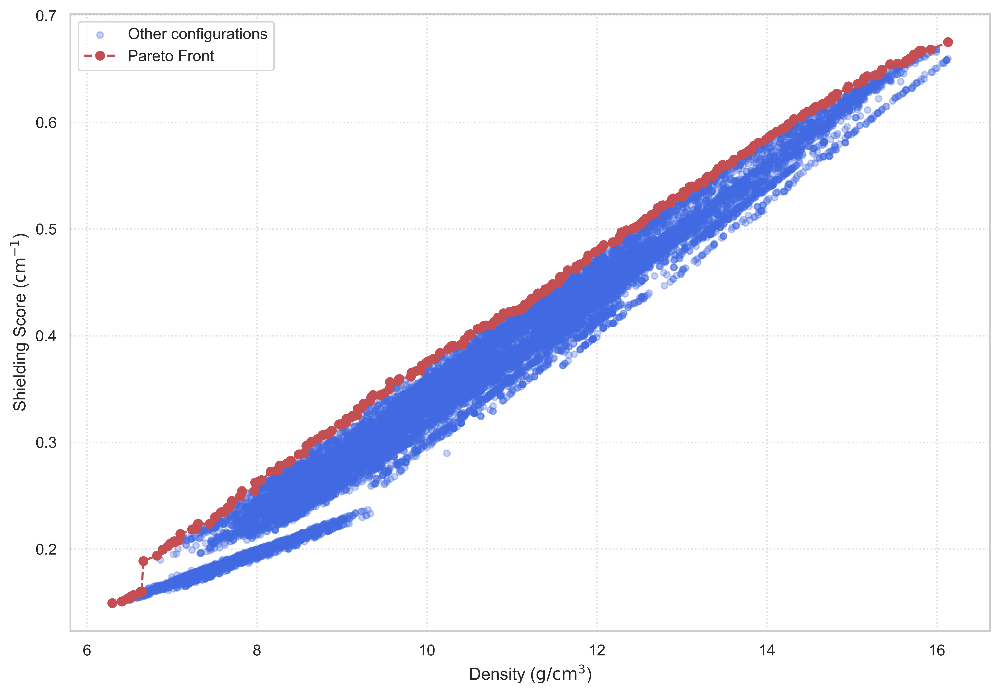

In [34]:
pareto_points = df.sort_values(by='Density (g/cm3)')
pf_x = [] # Price
pf_y = [] # LAC Score
current_max_score = -1

for i, row in pareto_points.iterrows():
    # Jika skor LAC lebih tinggi dari skor tertinggi sebelumnya pada harga yang lebih rendah/sama
    if row['Shielding Score (Avg LAC)'] > current_max_score:
        pf_x.append(row['Density (g/cm3)'])
        pf_y.append(row['Shielding Score (Avg LAC)'])
        current_max_score = row['Shielding Score (Avg LAC)']

# 2. Plotting
plt.figure(figsize=(10, 7), dpi=500)

# Plot semua titik konfigurasi
plt.scatter(df['Density (g/cm3)'], df['Shielding Score (Avg LAC)'], 
            alpha=0.3, color='royalblue', label='Other configurations', s=20)

# Plot Garis Pareto (The Best Trade-offs)
plt.plot(pf_x, pf_y, 'r--', marker='o', markersize=6, linewidth=1.5, label='Pareto Front')

"""
# 3. Anotasi untuk titik-titik di Pareto Front (Agar tahu komposisinya)
for i, row in pareto_points.iterrows():
    if row['Shielding Score (Avg LAC)'] in pf_y and row['Price (USD/kg)'] in pf_x:
        plt.annotate(row['Configuration'], 
                     (row['Price (USD/kg)'], row['Shielding Score (Avg LAC)']),
                     xytext=(5, 5), textcoords='offset points', 
                     fontsize=8, fontweight='bold', alpha=0.8)
"""
plt.xlabel(r'Density ($\text{g/cm}^3$)', fontsize=12)
plt.ylabel(r'Shielding Score ($\text{cm}^{-1}$)', fontsize=12)
#plt.xscale('log') 

plt.grid(True, linestyle=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.savefig("../outputs/pareto_density_vs_lac.png")
plt.show()

### 4. Three Dimensional View

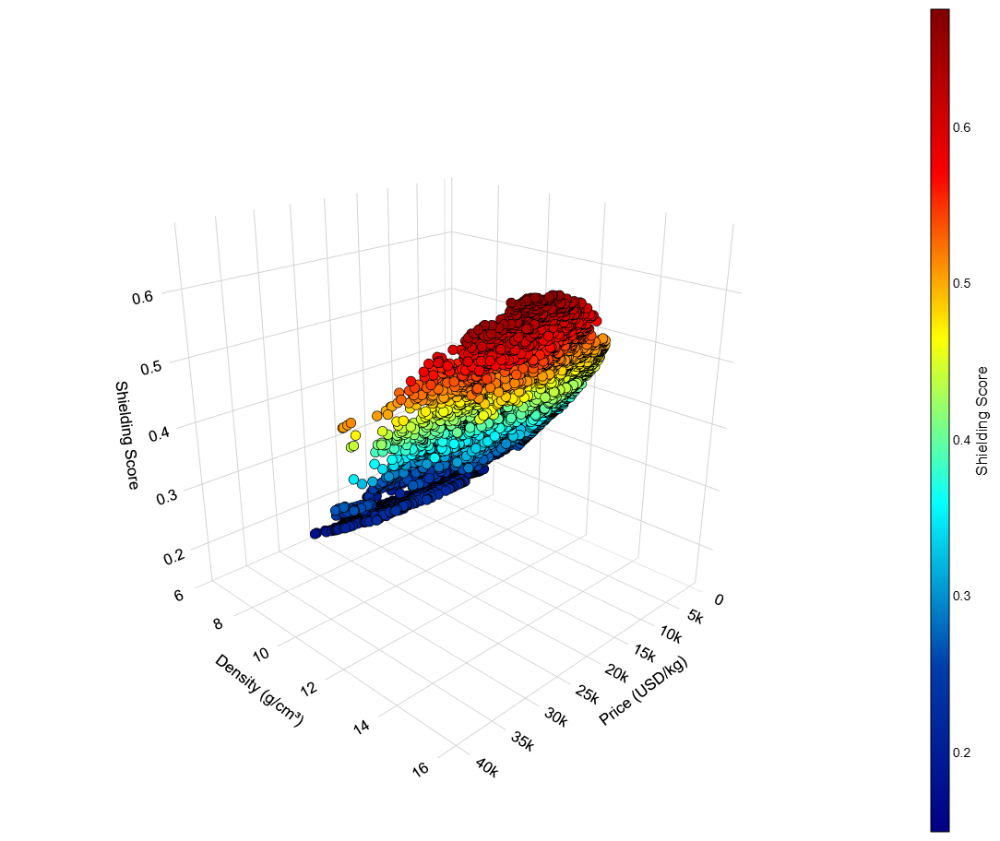

In [9]:
import plotly.graph_objects as go
import plotly.io as pio

# 1. Use the white template for a clean, academic background
pio.templates.default = "plotly_white"

fig = go.Figure(data=[go.Scatter3d(
    x=df['Price (USD/kg)'],
    y=df['Density (g/cm3)'],
    z=df['Shielding Score (Avg LAC)'],
    mode='markers',
    marker=dict(
        size=6, 
        color=df['Shielding Score (Avg LAC)'],
        colorscale='jet', 
        # opacity=0.9,
        # THE FIX: title and side are now nested inside a dictionary
        colorbar=dict(
            title=dict(
                text='Shielding Score',
                side='right'
            ),
            thickness=20,
            outlinecolor='black',
            outlinewidth=1
        ),
        # Thin line around markers makes them "pop" in static prints
        line=dict(width=0.5, color='black') 
    )
)])

# 2. Refined Layout for High-Resolution Export
fig.update_layout(
    width=1200, 
    height=900,
    font=dict(family="Arial", size=14, color="black"),
    scene=dict(
        xaxis=dict(title='Price (USD/kg)', gridcolor='lightgrey', showbackground=False),
        yaxis=dict(title='Density (g/cm³)', gridcolor='lightgrey', showbackground=False),
        zaxis=dict(title='Shielding Score', gridcolor='lightgrey', showbackground=False),
        # Professional perspective
        camera=dict(
            eye=dict(x=1.7, y=1.7, z=1.0) 
        ),
        aspectmode='cube'
    ),
    margin=dict(l=0, r=0, b=0, t=0)
)

# 3. STATIC EXPORT (The Journal Requirement)
# Most journals prefer .tiff or .eps at 300+ DPI.
# 'scale=3' turns a 1200px image into a 3600px high-res file.
# Requires: pip install kaleido
# fig.write_image("Figure_3D_Optimization.png", scale=3) 

fig.show()

## Balanced Result

In [36]:
# 1. Define the specific columns you want to use for the ranking
ranking_cols = ['Shielding Score (Avg LAC)', 'Price (USD/kg)', 'Density (g/cm3)']

# 2. Create a normalized version of ONLY these numeric columns
# We use .copy() to ensure we don't modify the original data yet
df_norm = df[ranking_cols].copy()
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())

# 3. Calculate the Weighted Score (The "Balanced Way")
# Weights: 50% Shielding, 25% Price, 25% Density
# Note: For Price and Density, we use (1 - normalized_value) because LOWER is BETTER
df['Final_Rank'] = (df_norm['Shielding Score (Avg LAC)'] * 0.50) + \
                   ((1 - df_norm['Price (USD/kg)']) * 0.25) + \
                   ((1 - df_norm['Density (g/cm3)']) * 0.25)

# 4. Sort and find the "Winner"
df_results = df.sort_values(by='Final_Rank', ascending=False)
best_balanced = df_results.iloc[0]

print(f"The Best Balanced Alloy is: {best_balanced['Configuration']}")
print(f"Score: {best_balanced['Final_Rank']:.4f}")

The Best Balanced Alloy is: Co-Hf-Mn-Ni-Ta
Score: 0.6464


In [3]:
import pandas as pd

# 1. Load data hasil optimasi Anda
df = pd.read_csv("../outputs/result-TPE-1000-trials.csv")

# 2. Ambil kolom-kolom yang ingin dipertahankan (kecilkan list ini sesuai kebutuhan artikel)
# Kita membuang kolom energi individual (LAC_81keV, dll) dan kolom elemen individual
cols_to_keep = [
    'Density (g/cm3)', 
    'Shielding Score (Avg LAC)', 
    'Price (USD/kg)', 
    'Delta (%)',
    'S_mix (J/mol.K)',
    'H_mix (kJ/mol)',
    'Tm_mix (K)',
    'Omega'
]

def create_simple_formula(row):
    # Memecah konfigurasi (misal: W-Ta-Fe-Ti-Ni)
    elements = row['Configuration'].split('-')
    formula = ""
    for el in elements:
        # Ambil nilai fraksi dari kolom elemen tersebut
        val = row[el]
        # Format teks biasa: NamaElemen + Nilai (contoh: W0.20Ta0.15...)
        formula += f"{el}{val:.2f}"
    return formula

# 3. Buat kolom baru 'Alloy Formula' dan hapus kolom lama
df['Alloy Formula'] = df.apply(create_simple_formula, axis=1)

# 4. Susun ulang kolom agar 'Alloy Formula' ada di paling depan
new_order = ['Alloy Formula'] + cols_to_keep
df_final = df[new_order] # Ambil 10 terbaik untuk tabel artikel

# Tampilkan hasil
print(df_final.to_string(index=False))

# 5. Simpan ke CSV baru khusus untuk tabel artikel
df_final.to_csv("../outputs/table_article_final.csv", index=False)

                 Alloy Formula  Density (g/cm3)  Shielding Score (Avg LAC)  Price (USD/kg)  Delta (%)  S_mix (J/mol.K)  H_mix (kJ/mol)  Tm_mix (K)    Omega
Co0.18Hf0.16Pd0.08Pt0.34Ta0.24           16.132                     0.6753        34239.07      5.170           12.563         -11.768      2352.3    2.511
Co0.19Hf0.14Ni0.08Pt0.32Ta0.27           15.929                     0.6683        30180.55      5.203           12.554          -2.267      2373.7   13.147
Co0.15Hf0.18Pd0.10Pt0.32Ta0.25           15.995                     0.6682        32934.66      5.315           12.744         -14.336      2373.1    2.110
Co0.15Hf0.18Pd0.10Pt0.32Ta0.25           15.995                     0.6682        32934.66      5.315           12.744         -14.336      2373.1    2.110
Co0.15Hf0.18Pd0.10Pt0.32Ta0.25           15.995                     0.6682        32934.66      5.315           12.744         -14.336      2373.1    2.110
Co0.12Hf0.20Pd0.10Pt0.29Ta0.29           15.961                 

In [5]:
import pandas as pd

# 1. Load data
df = pd.read_csv("../outputs/result-TPE-1000-trials.csv")

# 2. Proses Perankingan (Normalization & Weighting)
ranking_cols = ['Shielding Score (Avg LAC)', 'Price (USD/kg)', 'Density (g/cm3)']
df_norm = df[ranking_cols].copy()

# Min-Max Normalization
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())

# Hitung Skor Akhir (50% Shielding, 25% Price, 25% Density)
# Ingat: (1 - norm) untuk Price & Density karena kita ingin nilai rendah jadi skor tinggi
df['Final_Score'] = (df_norm['Shielding Score (Avg LAC)'] * 0.50) + \
                    ((1 - df_norm['Price (USD/kg)']) * 0.25) + \
                    ((1 - df_norm['Density (g/cm3)']) * 0.25)

# 3. Penyederhanaan Kolom (Format Tabel Artikel)
def create_formula(row):
    elements = row['Configuration'].split('-')
    return "".join([f"{el}{row[el]:.2f}" for el in elements])

df['Alloy Formula'] = df.apply(create_formula, axis=1)

# Pilih kolom yang ingin dipertahankan untuk Tabel Artikel
# Kita buang kolom elemen individual dan kolom LAC per energi
cols_to_keep = [
    'Alloy Formula', 
    'Density (g/cm3)', 
    'Shielding Score (Avg LAC)', 
    'Price (USD/kg)', 
    'Delta (%)',
    'S_mix (J/mol.K)',
    'H_mix (kJ/mol)',
    'Tm_mix (K)',
    'Omega',
    'Final_Score'
]

# 4. Urutkan berdasarkan Skor Tertinggi dan Simpan
df_article = df[cols_to_keep].sort_values(by='Final_Score', ascending=False)

# Simpan 20 teratas untuk naskah
df_top_20 = df_article
df_top_20.to_csv("../outputs/table_ranked_final.csv", index=False)

print("Tabel berhasil diranking dan diperbarui!")
print(df_top_20[['Alloy Formula', 'Final_Score']].head(5))

Tabel berhasil diranking dan diperbarui!
                       Alloy Formula  Final_Score
2172  Co0.11Hf0.30Mn0.14Ni0.12Ta0.33     0.646424
2272  Co0.18Hf0.26Mn0.10Ni0.12Ta0.34     0.645070
2217  Co0.11Hf0.31Mn0.14Ni0.12Ta0.31     0.644833
2218  Co0.11Hf0.31Mn0.14Ni0.12Ta0.31     0.644833
2367  Co0.13Hf0.24Mn0.17Ni0.12Ta0.35     0.644721


### Extra

I made  this because I need an input file for making that bar chart for composition. But sorted using final score.

In [2]:
import pandas as pd

# 1. Load data
df = pd.read_csv("../outputs/result-TPE-1000-trials-fixed.csv")

# 2. Proses Perankingan (Normalization & Weighting)
ranking_cols = ['Shielding Score (Avg LAC)', 'Price (USD/kg)', 'Density (g/cm3)']
df_norm = df[ranking_cols].copy()

# Min-Max Normalization
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())

# Hitung Skor Akhir (50% Shielding, 25% Price, 25% Density)
# Ingat: (1 - norm) untuk Price & Density karena kita ingin nilai rendah jadi skor tinggi
df['Final_Score'] = (df_norm['Shielding Score (Avg LAC)'] * 0.50) + \
                    ((1 - df_norm['Price (USD/kg)']) * 0.25) + \
                    ((1 - df_norm['Density (g/cm3)']) * 0.25)

# 3. Urutkan berdasarkan Skor Tertinggi dan Simpan
# Kita langsung menggunakan 'df' agar semua kolom asli tetap dipertahankan
df_ranked = df.sort_values(by='Final_Score', ascending=False)

# Menyimpan seluruh data yang sudah memiliki Final_Score dan terurut
df_ranked.to_csv("../outputs/table_ranked_final-for-final-rank.csv", index=False)

print("Tabel berhasil dihitung Final Score-nya, diranking, dan diperbarui dengan semua kolom tetap utuh!")

# Menampilkan 5 data teratas (Saya gunakan 'Configuration' sebagai identifier karena Alloy Formula dihapus)
print(df_ranked[['Configuration', 'Final_Score']].head(5))

Tabel berhasil dihitung Final Score-nya, diranking, dan diperbarui dengan semua kolom tetap utuh!
       Configuration  Final_Score
1618  Co-Hf-Mn-Ni-Ta     0.646424
1691  Co-Hf-Mn-Ni-Ta     0.645070
1648  Co-Hf-Mn-Ni-Ta     0.644833
1768  Co-Hf-Mn-Ni-Ta     0.644721
1702  Co-Hf-Nb-Ni-Ta     0.644449


In [1]:
import pandas as pd

# 1. Load data
df = pd.read_csv("../outputs/result-TPE-1000-trials.csv")

# 2. Proses Perankingan (Normalization & Weighting)
ranking_cols = ['Shielding Score (Avg LAC)', 'Price (USD/kg)', 'Density (g/cm3)']
df_norm = df[ranking_cols].copy()

# Min-Max Normalization
df_norm = (df_norm - df_norm.min()) / (df_norm.max() - df_norm.min())

# Hitung Skor Akhir (50% Shielding, 25% Price, 25% Density)
df['Final_Score'] = (df_norm['Shielding Score (Avg LAC)'] * 0.50) + \
                    ((1 - df_norm['Price (USD/kg)']) * 0.25) + \
                    ((1 - df_norm['Density (g/cm3)']) * 0.25)

# 3. Buat Alloy Formula
def create_formula(row):
    elements = str(row['Configuration']).split('-')
    return "".join([f"{el}{row[el]:.2f}" for el in elements])

df['Alloy Formula'] = df.apply(create_formula, axis=1)

# Opsional: Jika Anda ingin memindahkan kolom 'Alloy Formula' dan 'Final_Score' 
# ke urutan paling depan agar mudah dilihat, aktifkan dua baris di bawah ini:
# cols = ['Alloy Formula', 'Final_Score'] + [c for c in df.columns if c not in ['Alloy Formula', 'Final_Score']]
# df = df[cols]

# 4. Urutkan berdasarkan Skor Tertinggi dan Simpan (Semua kolom tetap ada)
df_sorted = df.sort_values(by='Final_Score', ascending=False)

# Simpan tabel secara utuh
df_sorted.to_csv("../outputs/magnum_opus.csv", index=False)

print("Tabel berhasil diranking dan diperbarui!")
print(df_sorted[['Alloy Formula', 'Final_Score']].head(5))

Tabel berhasil diranking dan diperbarui!
                       Alloy Formula  Final_Score
2172  Co0.11Hf0.30Mn0.14Ni0.12Ta0.33     0.646424
2272  Co0.18Hf0.26Mn0.10Ni0.12Ta0.34     0.645070
2217  Co0.11Hf0.31Mn0.14Ni0.12Ta0.31     0.644833
2218  Co0.11Hf0.31Mn0.14Ni0.12Ta0.31     0.644833
2367  Co0.13Hf0.24Mn0.17Ni0.12Ta0.35     0.644721


In [6]:
!pip install pycalphad

  Using cached setuptools_scm-10.0.5-py3-none-any.whl.metadata (6.5 kB)
  Using cached vcs_versioning-1.1.1-py3-none-any.whl.metadata (1.6 kB)
   ---------------------------------------- 0.0/2.2 MB ? eta -:--:--
   --------- ------------------------------ 0.5/2.2 MB 5.6 MB/s eta 0:00:01
   ------------------- -------------------- 1.0/2.2 MB 8.4 MB/s eta 0:00:01
   -------------------------------------- - 2.1/2.2 MB 4.5 MB/s eta 0:00:01
   ---------------------------------------- 2.2/2.2 MB 3.8 MB/s  0:00:00
   ---------------------------------------- 0.0/17.8 MB ? eta -:--:--
   ----- ---------------------------------- 2.4/17.8 MB 11.2 MB/s eta 0:00:02
   ---------- ----------------------------- 4.7/17.8 MB 11.9 MB/s eta 0:00:02
   --------------- ------------------------ 7.1/17.8 MB 11.8 MB/s eta 0:00:01
   ----------------- ---------------------- 7.6/17.8 MB 11.7 MB/s eta 0:00:01
   ---------------------- ----------------- 10.2/17.8 MB 10.1 MB/s eta 0:00:01
   -----------------------


[notice] A new release of pip is available: 26.1.1 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from pycalphad import Database, Model, equilibrium
import pycalphad.variables as v
from sympy import Symbol

# ==========================================
# 1. PARAMETER SISTEM NANOPARTIKEL (Bi-Pt)
# ==========================================
# Total atom = 309 (Bi: 146, Pt: 163)
X_BI = 146 / 309  # Fraksi mol Bismut (~0.4725)
X_PT = 163 / 309  # Fraksi mol Platina (~0.5275)

# Estimasi radius untuk 309 atom (dalam meter)
# Menggunakan pendekatan volume rata-rata wigner-seitz Bi & Pt
RADIUS = 1.05e-9  

# Energi permukaan rata-rata (J/m^2) - Nilai pendekatan untuk fasa padat & cair
# Catatan: Idealnya gamma_solid dan gamma_liquid didefinisikan berbeda jika data tersedia.
GAMMA_SOLID = 0.95  
GAMMA_LIQUID = 0.65  
V_M = 1.5e-5        # Volume molar rata-rata (m^3/mol)

# ==========================================
# 2. INSIALISASI DATABASE & MODEL
# ==========================================
# Pastikan Anda memiliki file database 'Bi-Pt.tdb' di direktori kerja Anda.
try:
    db = Database('Bi-Pt.tdb')
except FileNotFoundError:
    raise FileNotFoundError("Mohon siapkan file 'Bi-Pt.tdb' (SGTE atau database Bi-Pt terkait) di folder Anda. 🤓")

comps = ['BI', 'PT', 'VA']
phases = ['LIQUID', 'FCC_A1'] # Contoh fasa padat acak (disordered) dan cair

# ==========================================
# 3. MODIFIKASI MODEL GIBBS SECARA PROGRAMATIK
# ==========================================
models = {}
for phase in phases:
    mod = Model(db, comps, phase)
    
    # Pilih gamma berdasarkan jenis fasa
    gamma_val = GAMMA_LIQUID if phase == 'LIQUID' else GAMMA_SOLID
    
    # Tambahkan komponen energi bebas permukaan: (2 * gamma * V_m) / r
    # v.T adalah simbol temperatur dari pycalphad
    surface_energy_term = (2 * gamma_val * V_M) / RADIUS
    
    # Injeksikan ke dalam energi bebas fasa padat/cair
    mod.models['gem'] += surface_energy_term
    models[phase] = mod

# ==========================================
# 4. KALKULASI KESETIMBANGAN (BULK VS NANO)
# ==========================================
temperatures = np.arange(400, 1500, 5) # Rentang temperatur (Kelvin)

print("Memulai kalkulasi termodinamika untuk 309 atom Bi-Pt alloy... 🤓")

# 4a. Kalkulasi Kondisi Bulk (Tanpa modifikasi model)
eq_bulk = equilibrium(db, comps, phases, {v.X('PT'): X_PT, v.T: temperatures, v.P: 101325})

# 4b. Kalkulasi Kondisi Nano (Menggunakan model yang dimodifikasi)
eq_nano = equilibrium(db, comps, phases, {v.X('PT'): X_PT, v.T: temperatures, v.P: 101325}, model=models)

# ==========================================
# 5. EKSTRAKSI DATA & PLOTTING
# ==========================================
# Mengekstrak fraksi fasa LIQUID untuk mengidentifikasi melting range
liquid_fraction_bulk = eq_bulk.NP.sel(phase='LIQUID').values.squeeze()
liquid_fraction_nano = eq_nano.NP.sel(phase='LIQUID').values.squeeze()

plt.figure(figsize=(8, 5))
plt.plot(temperatures, liquid_fraction_bulk, label='Bulk Bi-Pt (X_Pt ~ 0.53)', color='black', linestyle='--')
plt.plot(temperatures, liquid_fraction_nano, label='Nano Bi-Pt (309 atoms, r ~ 1.05 nm)', color='red', linewidth=2)

plt.title('Estimasi Melting Behavior: Bulk vs Nanopartikel Bi-Pt 🤔')
plt.xlabel('Temperatur (K)')
plt.ylabel('Fraksi Fasa Cair (Liquid Fraction)')
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend()
plt.tight_layout()
plt.show()

FileNotFoundError: Mohon siapkan file 'Bi-Pt.tdb' (SGTE atau database Bi-Pt terkait) di folder Anda. 🤓